In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV
from xgboost import XGBClassifier as XGBC
import plotly.express as px
from umap import UMAP
from sklearn.manifold import TSNE
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [2]:
df = pd.read_csv('data/sph6004_assignment1_data.csv')

df.head()

,id,aki,gender,admission_age,race,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,...,ggt_max,ld_ldh_min,ld_ldh_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,height,weight_admit
0,36570066,3,F,79.953141,BLACK/AFRICAN AMERICAN,96.0,104.0,100.083333,103.0,126.0,...,NaN,236.0,318.0,15.0,6.0,5.0,4.0,0.0,157.0,110.0
1,39307659,0,F,78.194169,WHITE - RUSSIAN,72.0,134.0,97.263158,97.0,127.0,...,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,NaN,82.0
2,38743306,2,F,65.602396,WHITE,60.0,97.0,84.166667,95.0,143.0,...,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,NaN,62.1
3,32339865,2,F,64.906629,UNKNOWN,59.0,87.0,71.461538,113.0,150.0,...,NaN,NaN,NaN,15.0,1.0,0.0,1.0,1.0,170.0,113.1
4,35526987,2,M,57.438861,WHITE,57.0,100.0,82.387097,81.0,127.0,...,NaN,NaN,NaN,15.0,NaN,0.0,1.0,1.0,178.0,97.4


In [3]:
df.shape

(50920, 162)

In [4]:
df['aki'] = df.aki.map(lambda x: 1 if x > 0 else 0)

df.aki.value_counts()

aki
1    34060
0    16860
Name: count, dtype: int64

In [5]:
def na_ratio_acceptable(df, column_name, threshold=0.8):
    na_count = df[column_name].isna().sum()

    non_na_ratio = 1 - (na_count / df.shape[0])

    if non_na_ratio >= threshold:
        return True

    else:
        return False

In [6]:
acceptable_columns = []

for col in df.columns:
    if na_ratio_acceptable(df, col):
        acceptable_columns.append(col)

acceptable_columns

['id',
 'aki',
 'gender',
 'admission_age',
 'race',
 'heart_rate_min',
 'heart_rate_max',
 'heart_rate_mean',
 'sbp_min',
 'sbp_max',
 'sbp_mean',
 'dbp_min',
 'dbp_max',
 'dbp_mean',
 'mbp_min',
 'mbp_max',
 'mbp_mean',
 'resp_rate_min',
 'resp_rate_max',
 'resp_rate_mean',
 'temperature_min',
 'temperature_max',
 'temperature_mean',
 'spo2_min',
 'spo2_max',
 'spo2_mean',
 'glucose_min',
 'glucose_max',
 'glucose_mean',
 'hematocrit_min.1',
 'hematocrit_max.1',
 'hemoglobin_min.1',
 'hemoglobin_max.1',
 'platelets_min',
 'platelets_max',
 'wbc_min',
 'wbc_max',
 'aniongap_min',
 'aniongap_max',
 'bicarbonate_min.1',
 'bicarbonate_max.1',
 'bun_min',
 'bun_max',
 'calcium_min.1',
 'calcium_max.1',
 'chloride_min.1',
 'chloride_max.1',
 'glucose_min.2',
 'glucose_max.2',
 'sodium_min.1',
 'sodium_max.1',
 'potassium_min.1',
 'potassium_max.1',
 'inr_min',
 'inr_max',
 'pt_min',
 'pt_max',
 'ptt_min',
 'ptt_max',
 'gcs_min',
 'gcs_motor',
 'gcs_verbal',
 'gcs_eyes',
 'gcs_unable',
 'we

In [7]:
df = df[acceptable_columns].dropna()

print(f'number of missing entries = {df.isna().sum().sum()}')
print(f'number of remaining rows = {df.shape[0]}')

number of missing entries = 0
number of remaining rows = 38300


In [8]:
X_raw = df.drop('aki', axis=1)
X = X_raw.drop(['id', 'gender', 'race'], axis=1)
y = df.aki

In [9]:
X_train, X_test, y_train, y_test = train_test_split(
    X,y,test_size=0.2,random_state=10,
    stratify=y, shuffle=True
)

In [10]:
mean = X_train.mean()
std = X_train.std()

X_train = (X_train - mean) / std
X_test = (X_test - mean) / std

In [11]:
X_train.head()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,pt_min,pt_max,ptt_min,ptt_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,weight_admit
44966,-1.586491,-0.066317,0.087176,0.047715,-0.136765,-0.962979,-1.047796,0.236078,0.035066,-0.151016,...,-0.343042,-0.393031,0.028576,-0.360883,0.110782,0.477630,0.280358,0.776768,-0.49596,-0.752165
46317,0.127775,-0.327166,-0.628865,-0.328312,0.207266,-0.044033,-0.199291,0.321366,1.051457,0.141568,...,-0.343042,-0.009751,-0.117840,0.108371,-4.167152,-2.759538,-1.172155,-2.019414,-0.49596,0.180866
44337,1.369282,-0.001105,-1.249433,-0.846059,-0.423457,-0.919219,-0.906717,-1.469699,-1.489520,-1.827804,...,3.361816,2.009477,-0.048938,-0.306080,0.499685,0.477630,0.764528,0.776768,-0.49596,-0.554718
37686,-0.136645,-2.413962,-2.156418,-2.292542,0.035251,-0.306589,-0.060749,-0.957966,0.187525,-0.934457,...,0.618124,0.280045,0.631469,-0.052614,0.499685,0.477630,0.764528,0.776768,-0.49596,0.335726
42795,0.928852,0.064108,-0.056032,-0.073127,-0.136765,1.224988,1.587036,-0.787389,1.915389,-1.032926,...,0.058900,-0.178020,0.045802,-0.354033,0.499685,0.477630,0.764528,0.776768,-0.49596,0.827406


In [12]:
X_test.head()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,pt_min,pt_max,ptt_min,ptt_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,weight_admit
9278,-1.411858,1.629204,0.803216,1.374178,-0.136765,-0.175311,-0.077849,-0.616811,0.238344,-0.804180,...,3.047252,1.485973,1.415228,0.324160,0.499685,-0.169803,-1.656326,-0.155293,2.016226,0.893221
48799,0.119816,-0.327166,-0.724337,-0.664655,1.239359,1.049950,0.974739,1.941855,0.898998,2.051803,...,-0.482848,-0.449120,-0.565703,-0.580097,-0.278122,0.477630,0.280358,-0.155293,-0.495960,-0.148211
13678,1.842898,-2.153112,-0.533393,-0.914943,-2.602320,1.137469,-0.874331,-1.384411,3.338336,-0.309662,...,0.408415,0.008945,0.088866,-0.336907,-4.167152,-2.759538,-1.172155,-2.019414,-0.495960,-1.212873
25076,-0.193893,-0.653228,-1.058489,-0.975133,0.149928,1.181228,0.671455,-0.105078,-0.117392,-0.501974,...,-0.535275,-0.495862,-0.574316,-0.600649,0.499685,-0.169803,-1.656326,-2.019414,2.016226,-0.051424
20898,-0.400389,1.172718,1.376049,1.640459,1.755406,1.837618,2.509070,0.491944,3.897351,1.557787,...,0.076376,-0.168672,0.519503,-0.165646,-1.055928,-0.169803,-0.203813,-0.155293,-0.495960,0.761591


In [13]:
correlation_matrix = X_train.corr()

threshold = 0.9
threshold_matrix = correlation_matrix[abs(correlation_matrix) >= threshold]
threshold_matrix = threshold_matrix.stack().reset_index().dropna(how='any')

threshold_matrix.columns = ['variable_1', 'variable_2', 'correlation']
threshold_matrix = threshold_matrix.sort_values(by='correlation', ascending=False)
threshold_matrix = threshold_matrix[threshold_matrix.variable_1 != threshold_matrix.variable_2]

threshold_matrix['sorted_pair'] = threshold_matrix.apply(lambda row: tuple(sorted([row['variable_1'], 
                                                                                   row['variable_2']])), 
                                                         axis=1)

threshold_matrix = threshold_matrix.drop_duplicates(subset=['sorted_pair']).drop('sorted_pair', axis=1)

threshold_matrix

,variable_1,variable_2,correlation
60,inr_min,pt_min,0.991409
28,hematocrit_min.1,hemoglobin_min.1,0.966255
33,hemoglobin_max.1,hematocrit_max.1,0.960229
47,bun_max,bun_min,0.956000
65,pt_max,inr_max,0.939671
36,platelets_min,platelets_max,0.922934
10,dbp_mean,mbp_mean,0.903644


In [14]:
sum([x in threshold_matrix.variable_1 for x in threshold_matrix.variable_2])

0

In [15]:
X_train = X_train.drop(threshold_matrix.variable_1.unique(), axis=1)

X_train.head()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,mbp_min,...,inr_max,pt_min,ptt_min,ptt_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,weight_admit
44966,-1.586491,-0.066317,0.087176,0.047715,-0.136765,-0.962979,-1.047796,0.236078,0.035066,-0.575719,...,-0.396360,-0.343042,0.028576,-0.360883,0.110782,0.477630,0.280358,0.776768,-0.49596,-0.752165
46317,0.127775,-0.327166,-0.628865,-0.328312,0.207266,-0.044033,-0.199291,0.321366,1.051457,0.358790,...,-0.025661,-0.343042,-0.117840,0.108371,-4.167152,-2.759538,-1.172155,-2.019414,-0.49596,0.180866
44337,1.369282,-0.001105,-1.249433,-0.846059,-0.423457,-0.919219,-0.906717,-1.469699,-1.489520,-1.007031,...,2.291209,3.361816,-0.048938,-0.306080,0.499685,0.477630,0.764528,0.776768,-0.49596,-0.554718
37686,-0.136645,-2.413962,-2.156418,-2.292542,0.035251,-0.306589,-0.060749,-0.957966,0.187525,-0.647604,...,0.252363,0.618124,0.631469,-0.052614,0.499685,0.477630,0.764528,0.776768,-0.49596,0.335726
42795,0.928852,0.064108,-0.056032,-0.073127,-0.136765,1.224988,1.587036,-0.787389,1.915389,-0.360063,...,-0.211011,0.058900,0.045802,-0.354033,0.499685,0.477630,0.764528,0.776768,-0.49596,0.827406


In [16]:
y_train.value_counts()

aki
1    21019
0     9621
Name: count, dtype: int64

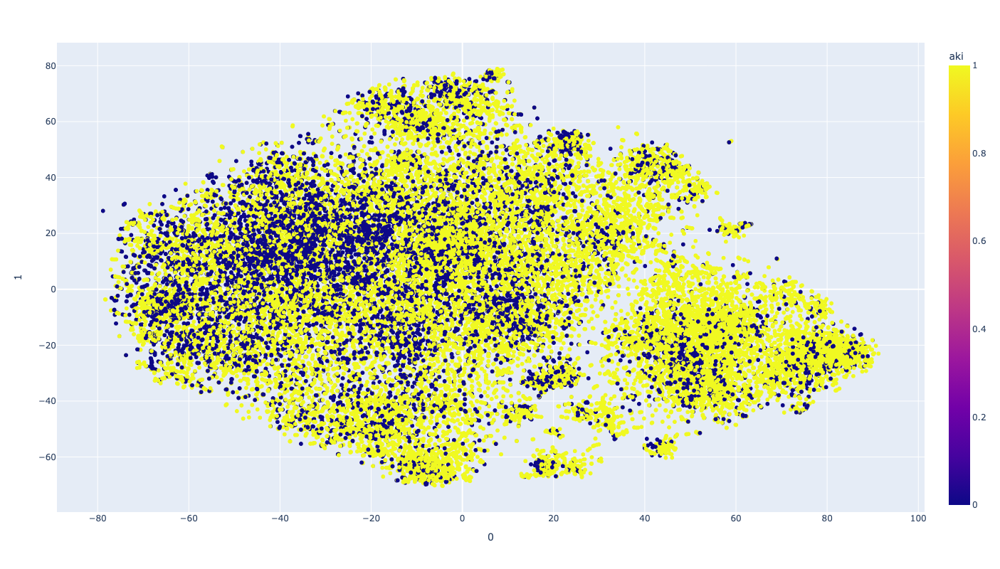

In [17]:
tsne = TSNE(n_components=2, random_state=0)

projections = tsne.fit_transform(X_train)

fig = px.scatter(
    projections, x=0, y=1,
    color=y_train, labels={'color': 'aki'},
    height=800,
    width=800
)

fig.show()

In [18]:
model = XGBC(reg_lambda=1)
stratifiedKF = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)

ffs_xgb = SFS(model, 
           k_features='best', 
           forward=True, 
           floating=False, 
           verbose=0,
           scoring='balanced_accuracy',
           cv=stratifiedKF)

ffs_xgb = ffs_xgb.fit(X_train, y_train)

<Figure size 2000x1000 with 0 Axes>

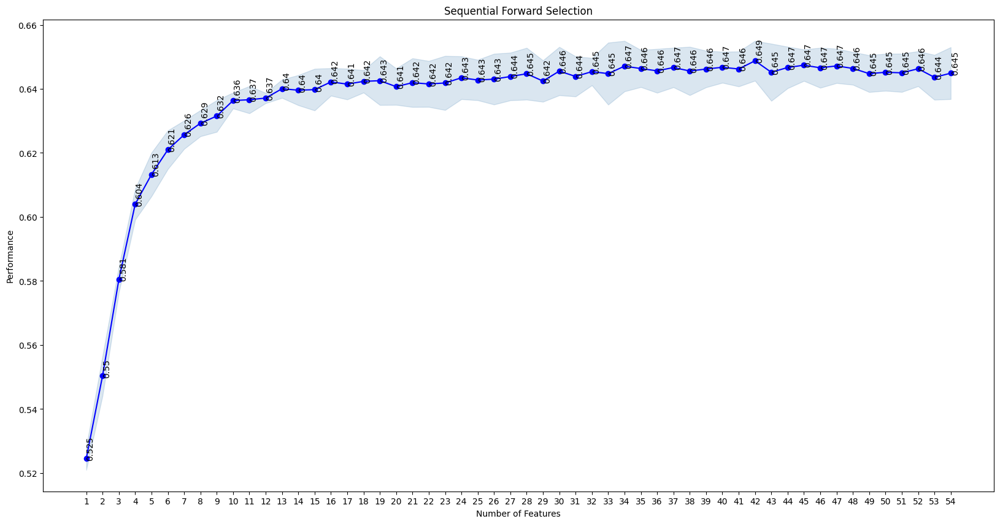

In [19]:
metric_dict = ffs_xgb.get_metric_dict(confidence_interval=0.95)

plt.figure(figsize=(20, 10))
fig = plot_sfs(metric_dict, figsize=(20, 10))

for key in metric_dict.keys():
    score = metric_dict[key]['avg_score']
    plt.text(x=key, y=score, s=f'{round(score,3)}', rotation='vertical')

plt.title('Sequential Forward Selection')
plt.savefig('data/images/sequential_forward_selection.png', bbox_inches='tight')

plt.show()

In [20]:
len(ffs_xgb.k_feature_idx_)

42

In [21]:
ffs_df = pd.DataFrame.from_dict(metric_dict).T

ffs_df['num_features_selected'] = ffs_df.feature_idx.map(lambda row: len(row))

ffs_df.head()

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,num_features_selected
1,"(0,)","[0.5263475434740896, 0.5256868520427036, 0.519...",0.524557,"(admission_age,)",0.004568,0.003554,0.001777,1
2,"(0, 53)","[0.5403788293892956, 0.5590861391289554, 0.551...",0.550422,"(admission_age, weight_admit)",0.007956,0.00619,0.003095,2
3,"(0, 50, 53)","[0.576338048507411, 0.5850417679627955, 0.5847...",0.580504,"(admission_age, gcs_verbal, weight_admit)",0.005137,0.003997,0.001998,3
4,"(0, 44, 50, 53)","[0.5991892683139115, 0.6027657057628513, 0.604...",0.603998,"(admission_age, inr_max, gcs_verbal, weight_ad...",0.006206,0.004828,0.002414,4
5,"(0, 33, 44, 50, 53)","[0.605518504305374, 0.611521845346774, 0.61553...",0.613282,"(admission_age, bun_min, inr_max, gcs_verbal, ...",0.008744,0.006803,0.003401,5


In [28]:
def composite_error(row, df=ffs_df, min_features=5):
    if len(row['feature_idx']) < min_features:
        err = 1.0
        return err
        
    else:
        num_features_penalty = row['num_features_selected'] / max(df['num_features_selected'])
        variance_penalty = (row['std_dev'] / max(df['std_dev']))
        performance_penalty = (1 - row['avg_score'])
    
        err = (num_features_penalty + variance_penalty + performance_penalty) / 3
    
        return err

In [29]:
ffs_df['composite_error'] = ffs_df.apply(composite_error, axis=1)

ffs_df.sort_values(by=['composite_error']).head()

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,num_features_selected,composite_error
12,"(0, 2, 4, 15, 16, 19, 26, 33, 37, 44, 50, 53)","[0.6355755136678067, 0.6351128813069822, 0.639...",0.637129,"(admission_age, heart_rate_max, sbp_min, tempe...",0.002051,0.001596,0.000798,12,0.249980
10,"(0, 2, 4, 15, 16, 33, 37, 44, 50, 53)","[0.6365930081439121, 0.6334126888360951, 0.638...",0.636356,"(admission_age, heart_rate_max, sbp_min, tempe...",0.003178,0.002473,0.001236,10,0.268095
13,"(0, 2, 4, 15, 16, 18, 19, 26, 33, 37, 44, 50, 53)","[0.6396187869784444, 0.6397335178258109, 0.643...",0.64004,"(admission_age, heart_rate_max, sbp_min, tempe...",0.003677,0.002861,0.00143,13,0.298741
8,"(0, 2, 16, 33, 37, 44, 50, 53)","[0.6234231926429834, 0.6258369912033089, 0.630...",0.629265,"(admission_age, heart_rate_max, temperature_ma...",0.005238,0.004076,0.002038,8,0.313304
7,"(0, 2, 16, 33, 44, 50, 53)","[0.62042362387272, 0.6220006784944939, 0.62950...",0.625676,"(admission_age, heart_rate_max, temperature_ma...",0.005684,0.004422,0.002211,7,0.320265


In [24]:
best_ffs = ffs_df[ffs_df.num_features_selected == 12]

selected_features = list(best_ffs.feature_names.values[0])

selected_features

['admission_age',
 'heart_rate_max',
 'sbp_min',
 'temperature_min',
 'temperature_max',
 'spo2_max',
 'platelets_max',
 'bun_min',
 'chloride_max.1',
 'inr_max',
 'gcs_verbal',
 'weight_admit']

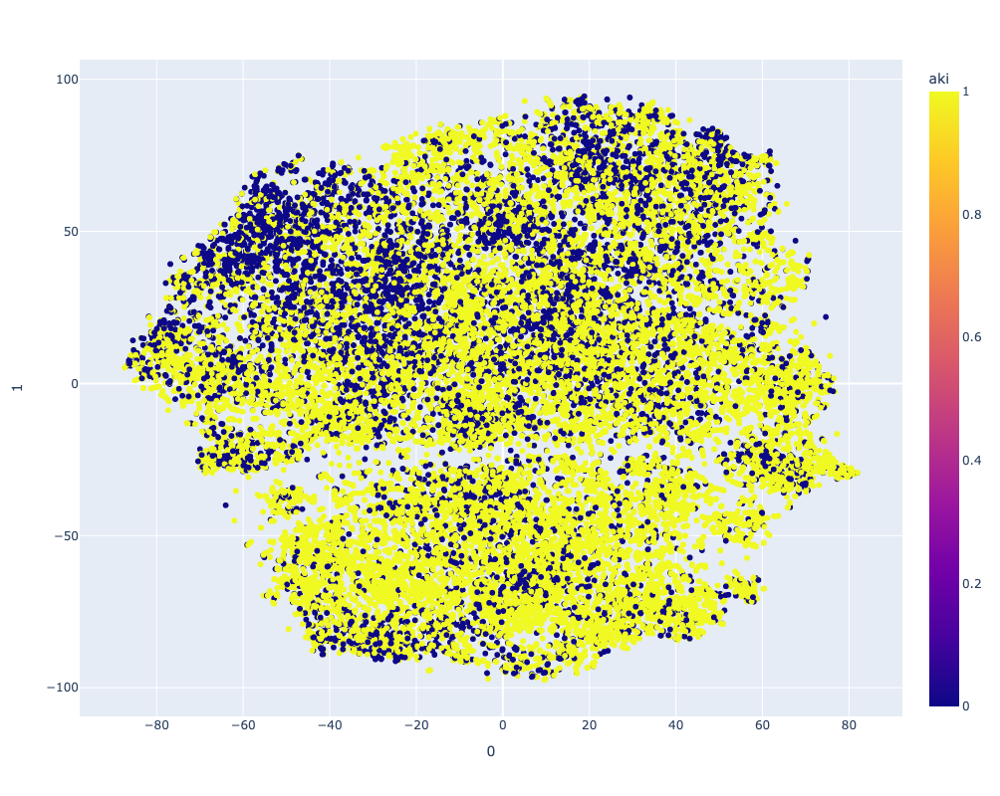

In [25]:
tsne_2d = TSNE(n_components=2, random_state=0)

proj_2d = tsne_2d.fit_transform(X_train[selected_features])

fig = px.scatter(
    proj_2d, x=0, y=1,
    color=y_train, labels={'color': 'aki'},
    height=800,
    width=800
)
fig.show()

In [26]:
X_train = X_train[selected_features]
X_test = X_test[selected_features]

In [27]:
save_path = 'data/cleaned'

X_train.to_csv(f'{save_path}/X_train.csv', index=False)
X_test.to_csv(f'{save_path}/X_test.csv', index=False)
y_train.to_csv(f'{save_path}/y_train.csv', index=False)
y_test.to_csv(f'{save_path}/y_test.csv', index=False)
print('train and test saved')

train and test saved
